#### Title: Exercice 2.2
#### Author: Jerock Kalala
#### Date: March 29th 2023
#### Modified By: --
#### EDA for Predictive Analytics

Components of EDA
To me, there are main components of exploring data:

Understanding your variables
Cleaning your dataset
Analyzing relationships between variables

In [30]:
#Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline
from pandas_profiling import ProfileReport
from fpdf import FPDF


### Problem number 1

Let’s import the data and use pandas to retrieve some descriptive statistics:

In [4]:
pdf = FPDF()
pdf.add_page()
pdf.set_font("Arial", "B", size= 12)
#pdf.write(4, "hello Jerock")
#pdf.output("un.pdf")

In [6]:
#import data
df = pd.read_csv("E:\\Bellevue\\Spring_2023\\DSC410_Predictive Analytics\Week_2\\eda_data.csv")


In [55]:
print("Here is the number of rows by the number of columns for my dataset: \n", df.shape)
print()
df.head()


Here is the number of rows by the number of columns for my dataset: 
 (9999, 15)



,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,y
0,-17.933519,6.559220,-14.452810,-4.732855,0.381673,2.563194,"($1,306.52)",-89.394348,-28.454044,-16.201298,-0.01%,0.217010,9.729891,-0.786431,0.666146
1,-37.214754,10.774930,-15.384004,-0.077339,10.983774,-15.210206,($24.86),153.032652,-32.557736,69.675903,0.00%,-3.584908,35.727926,-0.985552,0.378411
2,0.330441,-19.609972,-9.167911,2.064124,12.071688,12.506141,($110.85),-141.437276,-20.794952,55.042604,0.00%,-3.991366,-9.283523,-3.394718,0.624498
3,-13.709765,-8.011390,6.759264,1.727615,-1.768382,24.039733,($324.43),51.039653,-7.046908,-31.424419,0.01%,7.908897,-2.891882,-2.690222,0.126622
4,-4.202598,7.076210,-26.004919,-4.269696,-3.414224,2.115989,"$1,213.37",-31.046700,19.061182,-31.525515,-0.01%,0.846719,25.497480,3.516801,0.640025


Note: Our dataset has 15 columns and 9999 rows

In [19]:
df.dtypes

x0     float64
x1     float64
x2     float64
x3     float64
x4     float64
x5     float64
x6      object
x7     float64
x8     float64
x9     float64
x10     object
x11    float64
x12    float64
x13    float64
y      float64
dtype: object

Note: Some features have of object type. During the cleaning process we may decide to change the data type, or keep it as is,

In [20]:
b=df.describe()
b.to_html("deux.html")

Check for duplication

In [26]:
df.nunique()

x0     9996
x1     9995
x2     9996
x3     9997
x4     9997
x5     9999
x6     9849
x7     9998
x8     9999
x9     9996
x10       9
x11    9995
x12    9999
x13    9998
y      9999
dtype: int64

Missing values Calculation

In [28]:
df.isnull().sum()

x0     3
x1     4
x2     3
x3     2
x4     2
x5     0
x6     3
x7     1
x8     0
x9     3
x10    2
x11    4
x12    0
x13    1
y      0
dtype: int64

The below code helps to calculate the percentage of missing values in each column

In [29]:
(df.isnull().sum()/(len(df)))*100

x0     0.030003
x1     0.040004
x2     0.030003
x3     0.020002
x4     0.020002
x5     0.000000
x6     0.030003
x7     0.010001
x8     0.000000
x9     0.030003
x10    0.020002
x11    0.040004
x12    0.000000
x13    0.010001
y      0.000000
dtype: float64

#Descriptive statistics and histogram

1. EDA for numerical features

In [9]:
#LEt's create two lists of numerical and categorical feature
numerical_features =['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x7', 'x8', 'x9', 'x11', 'x12', 'x13', 'y']
non_numerical_features = ['x6', 'x10']

In [33]:
def desc_num_feature(feature_name, bins=30, edgecolor='k', **kwargs):
    fig, ax = plt.subplots(figsize=(8,4))
    df[feature_name].hist(bins=bins, edgecolor=edgecolor, ax=ax, **kwargs)
    ax.set_title(feature_name, size=15)
    plt.figtext(1,0.15, str(df[feature_name].describe().round(2).astype(str)), size=17)

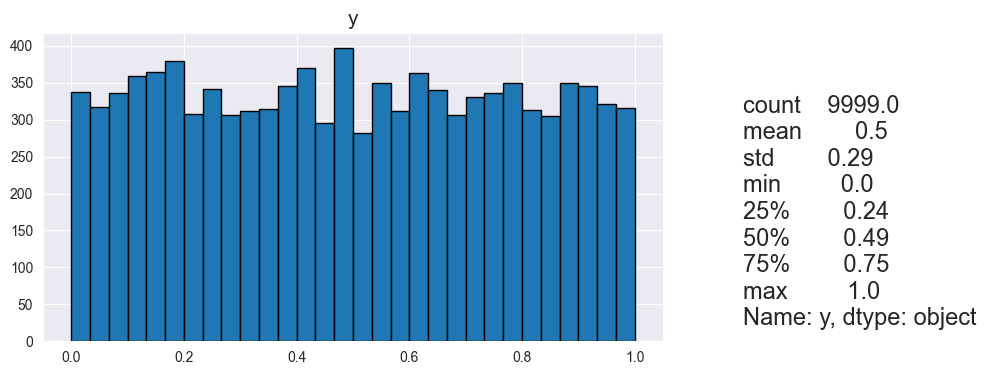

In [35]:
desc_num_feature('y')
plt.savefig('line2_plot.pdf')

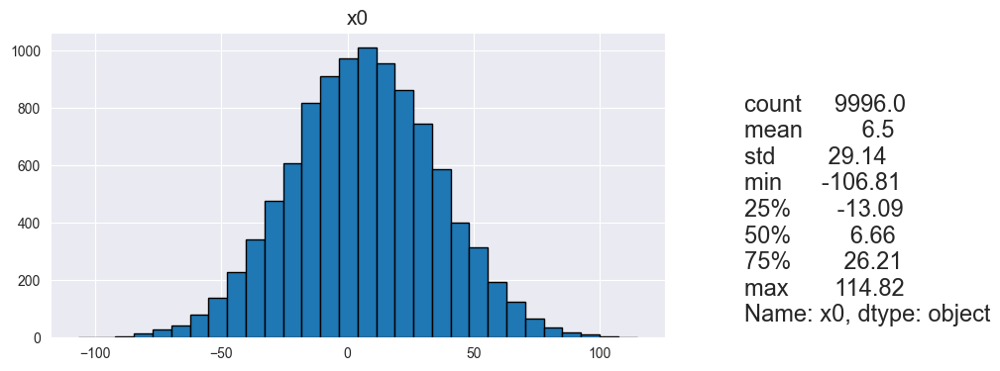

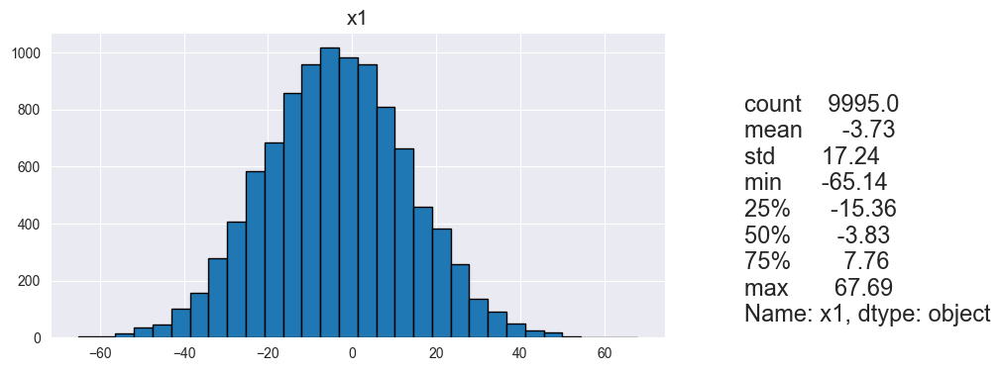

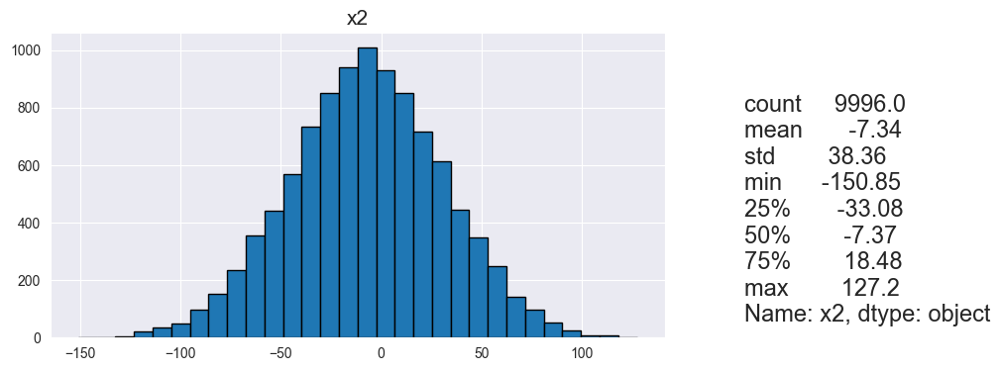

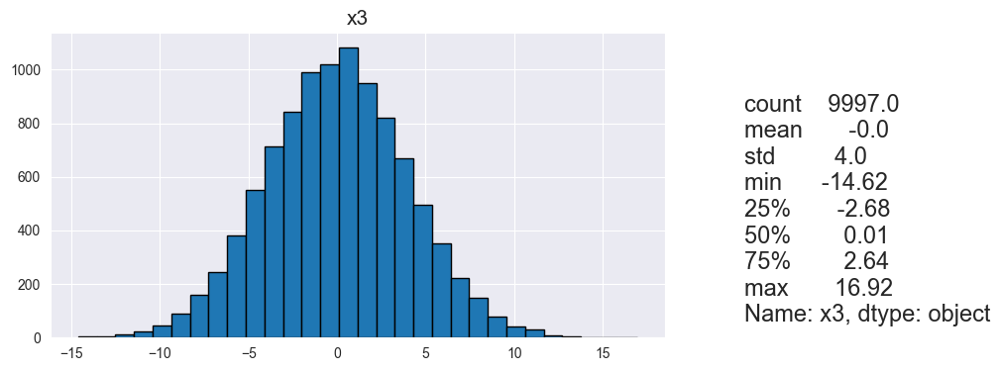

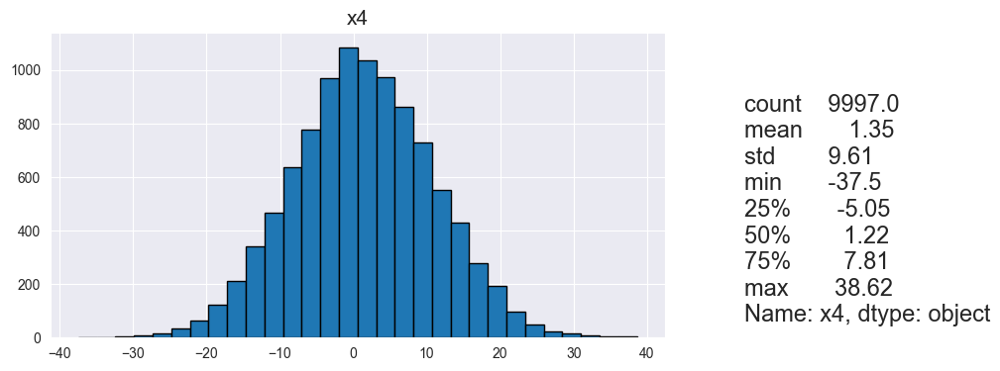

...

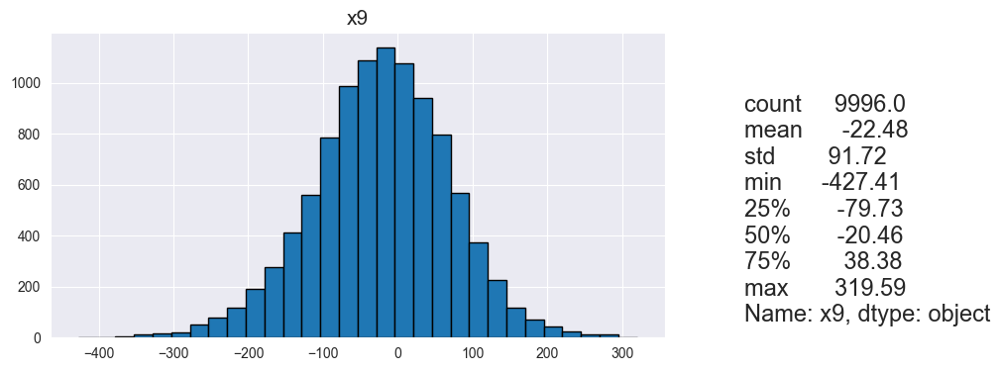

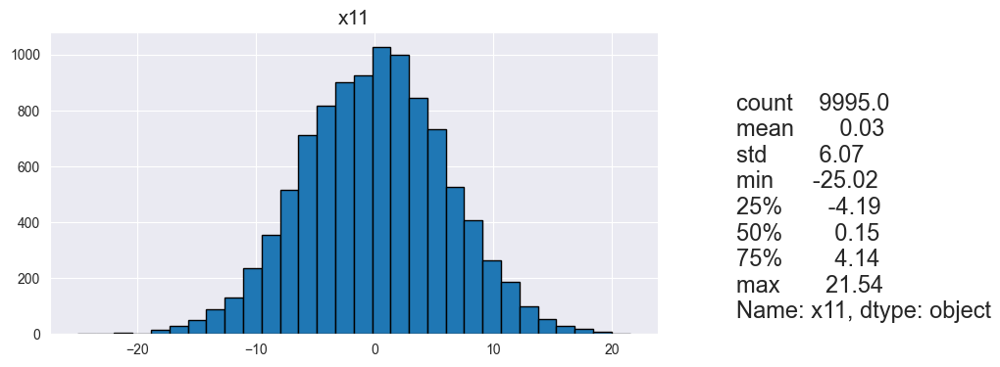

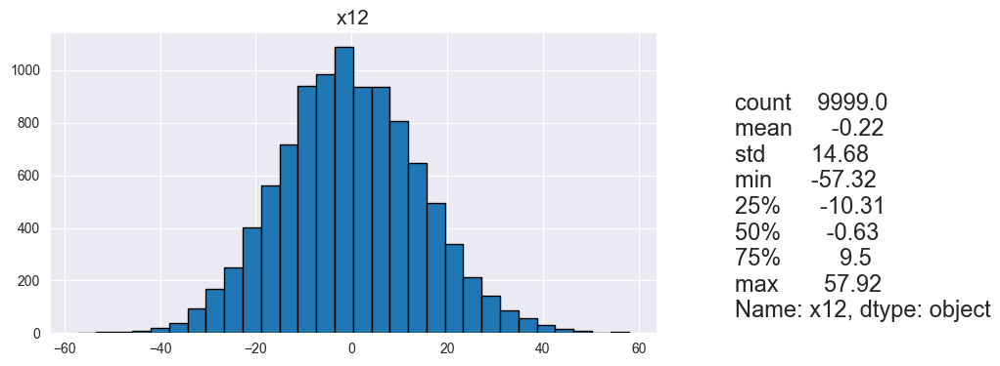

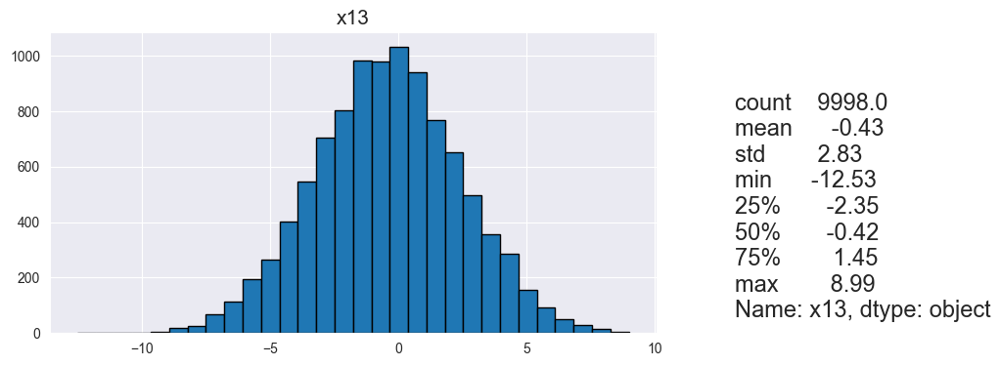

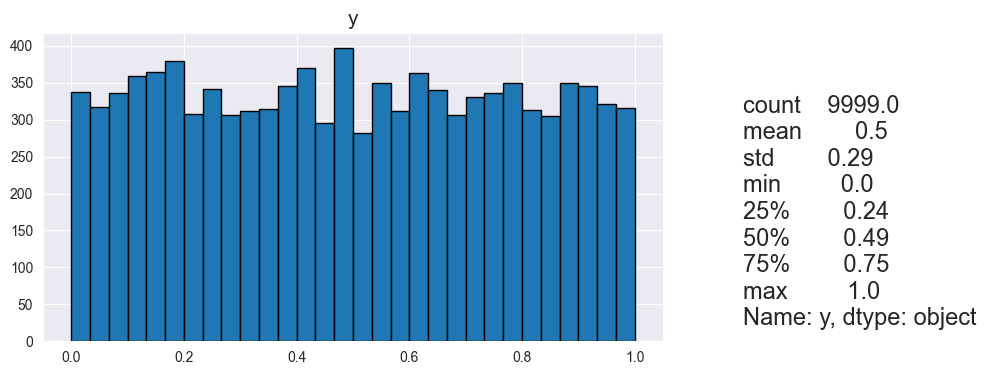

In [36]:
for x in numerical_features:
    desc_num_feature(x)
    plt.savefig('line3_plot.pdf')

2. EDA for non numerical features

        count  percent
0.00%    3914     39.2
-0.01%   2409     24.1
0.01%    2361     23.6
0.02%     581      5.8
-0.02%    579      5.8
0.03%      73      0.7
-0.03%     72      0.7
-0.04%      4      0.0
0.04%       4      0.0


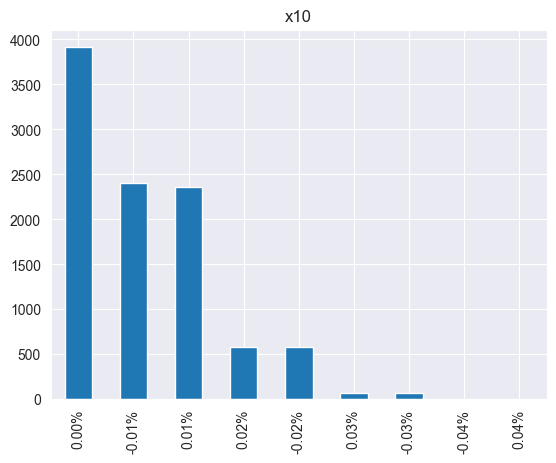

In [37]:
feature = non_numerical_features[1]
count = df[feature].value_counts()
percent = 100*df[feature].value_counts(normalize=True)
df2 = pd.DataFrame({'count':count, 'percent':percent.round(1)})
print(df2)
count.plot(kind='bar', title=feature);
plt.savefig('line4_plot.pdf')

Now let's analyse the relationship between tw0 numerical features

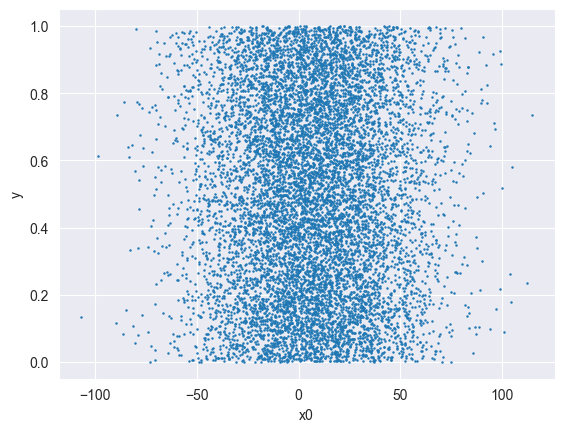

In [38]:
df.plot.scatter(x='x0', y='y', s=0.6);
plt.savefig('line5_plot.pdf')

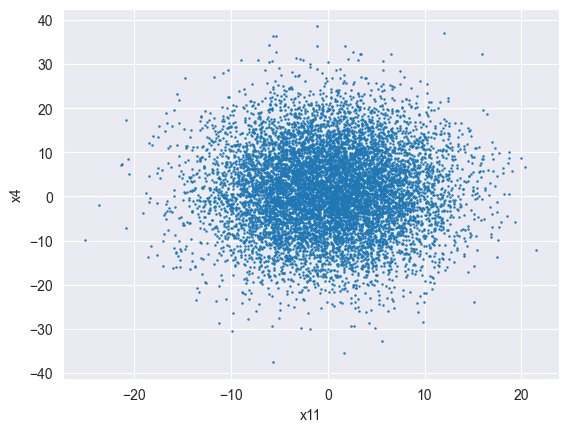

In [39]:
df.plot.scatter(x='x11', y='x4', s=0.6);
plt.savefig('line6_plot.pdf')

Now let's use seaborn to vizualise all the numerical features at the same time'

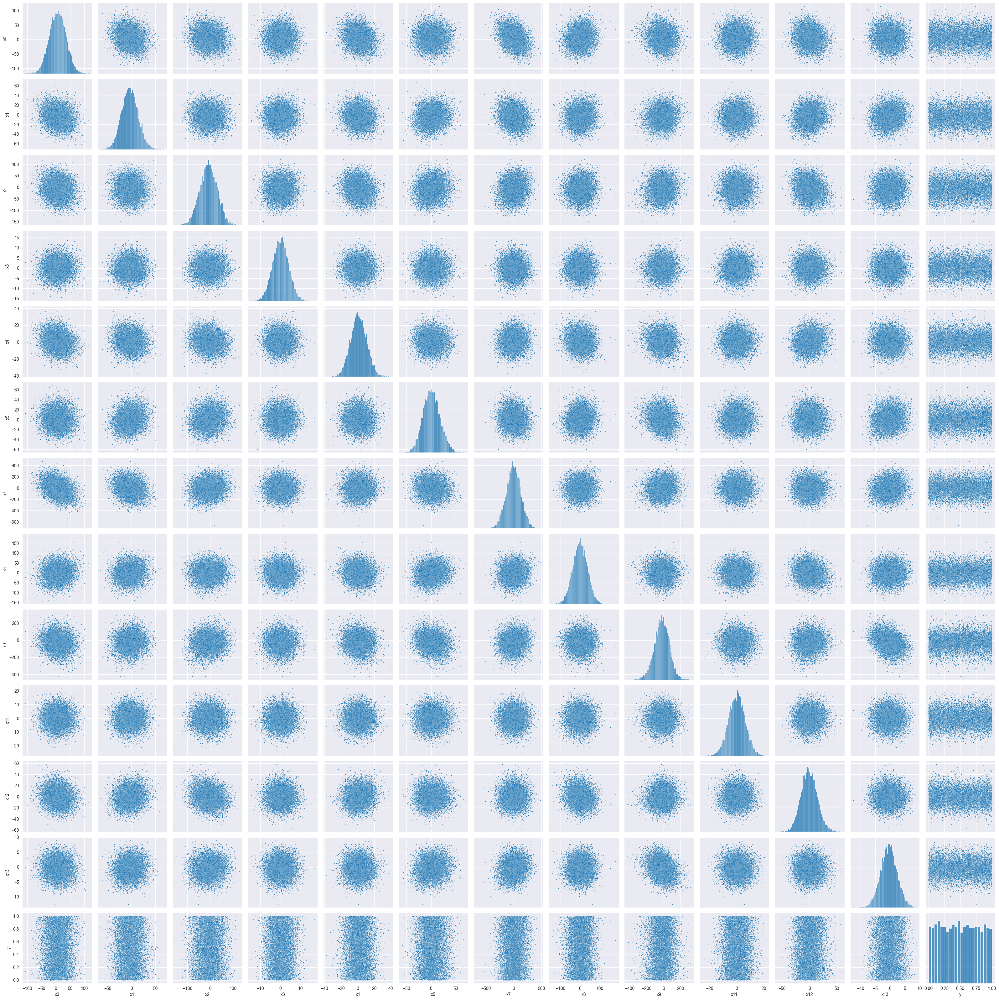

In [40]:
sns.pairplot(df[numerical_features], plot_kws={"s": 2});
plt.savefig('line7_plot.pdf')

Let's see now the correlation between features (by finding the correlation coefficient)

In [46]:
df[numerical_features].corr()

,x0,x1,x2,x3,x4,x5,x7,x8,x9,x11,x12,x13,y
x0,1.000000,-0.219569,-0.147841,0.001725,-0.190191,-0.037337,-0.362803,0.087414,-0.116586,-0.001615,-0.125526,-0.058138,-0.004856
x1,-0.219569,1.000000,-0.024894,0.002963,-0.115697,0.144764,-0.216378,0.078245,0.070796,0.002412,0.144808,0.100962,-0.006226
x2,-0.147841,-0.024894,1.000000,0.016473,-0.152140,0.121463,0.130809,0.026149,0.076399,0.002097,-0.183583,0.079056,0.005577
x3,0.001725,0.002963,0.016473,1.000000,-0.005837,-0.000729,-0.016484,-0.022474,0.002219,0.009156,0.004372,0.004896,-0.004414
x4,-0.190191,-0.115697,-0.152140,-0.005837,1.000000,-0.038982,0.059076,-0.094444,-0.097260,0.001803,0.121232,-0.030424,0.000015
x5,-0.037337,0.144764,0.121463,-0.000729,-0.038982,1.000000,-0.089647,0.109608,-0.186171,0.004956,-0.018823,0.127856,0.009866
x7,-0.362803,-0.216378,0.130809,-0.016484,0.059076,-0.089647,1.000000,0.062623,0.086901,-0.011249,0.000520,0.148375,-0.005623
x8,0.087414,0.078245,0.026149,-0.022474,-0.094444,0.109608,0.062623,1.000000,-0.014459,-0.006496,-0.144371,0.037877,-0.000371
x9,-0.116586,0.070796,0.076399,0.002219,-0.097260,-0.186171,0.086901,-0.014459,1.000000,0.006954,0.054775,-0.323785,0.020015
x11,-0.001615,0.002412,0.002097,0.009156,0.001803,0.004956,-0.011249,-0.006496,0.006954,1.000000,0.015121,-0.007004,0.001648


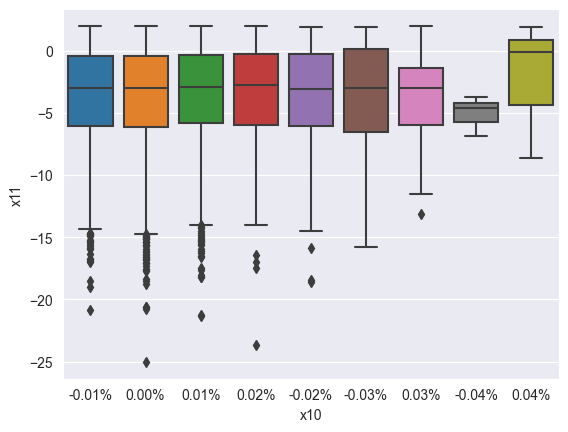

In [41]:
sns.boxplot(x='x10', y='x11', data=df.loc[df['x11']<2]);
plt.savefig('line8_plot.pdf')